Mental Health & Therapy,

Human-Robot Interaction (HRI) - vector robot

Gaming & Entertainment

Market Research & Advertising

Content Moderation in Online Platforms

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
model_path= '/content/drive/MyDrive/SLP'

In [ ]:
from transformers import AutoModelForCausalLM, AutoTokenizer

# Load the tokenizer and model
tokenizer = AutoTokenizer.from_pretrained(model_path)
model = AutoModelForCausalLM.from_pretrained(model_path)

If you want to use `RobertaLMHeadModel` as a standalone, add `is_decoder=True.`
Some weights of RobertaForCausalLM were not initialized from the model checkpoint at /content/drive/MyDrive/SLP and are newly initialized: ['lm_head.bias', 'lm_head.decoder.bias', 'lm_head.dense.bias', 'lm_head.dense.weight', 'lm_head.layer_norm.bias', 'lm_head.layer_norm.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [ ]:
input_text = "Hi there Myself Gopal, fuck you"
inputs = tokenizer(input_text, return_tensors="pt")

In [ ]:
class_names = [
    "admiration", "amusement", "anger", "annoyance", "approval",
    "caring", "confusion", "curiosity", "desire", "disappointment",
    "disapproval", "disgust", "embarrassment", "excitement", "fear",
    "gratitude", "grief", "joy", "love", "nervousness",
    "optimism", "pride", "realization", "relief", "remorse",
    "sadness", "surprise", "neutral"
]


In [ ]:
import torch
from google.colab import drive
from transformers import AutoModelForSequenceClassification, AutoTokenizer

# Load the tokenizer and model for emotion classification
tokenizer = AutoTokenizer.from_pretrained(model_path)
model = AutoModelForSequenceClassification.from_pretrained(model_path)

# Define the class names based on GoEmotions labels
class_names = [
    "admiration", "amusement", "anger", "annoyance", "approval",
    "caring", "confusion", "curiosity", "desire", "disappointment",
    "disapproval", "disgust", "embarrassment", "excitement", "fear",
    "gratitude", "grief", "joy", "love", "nervousness",
    "optimism", "pride", "realization", "relief", "remorse",
    "sadness", "surprise", "neutral"
]


In [ ]:
import matplotlib.pyplot as plt
def classify_emotion(input_text):
    inputs = tokenizer(input_text, return_tensors="pt")

    # Make sure to put the model in evaluation mode
    model.eval()

    # Run inference
    with torch.no_grad():
        outputs = model(**inputs)

    # Get logits and apply softmax to get probabilities
    logits = outputs.logits
    probabilities = torch.softmax(logits, dim=1)

    # Get predicted classes (emotions)
    predicted_classes = torch.argmax(probabilities, dim=1)

    # Convert predicted classes to a list
    predicted_classes_list = predicted_classes.tolist()

    # Print results with class names
    for idx in predicted_classes_list:
        print(f"Predicted class index: {idx}, Emotion: {class_names[idx]}")

    # Get top 3 emotions and their probabilities
    top3_probabilities, top3_indices = torch.topk(probabilities, 3)

    # Convert tensors to lists for easier handling when plotting
    top3_probabilities_list = top3_probabilities[0].tolist()
    top3_indices_list = top3_indices[0].tolist()

    # Print top 3 emotions with their probabilities
    print("\nTop 3 Predicted Emotions:")
    for i in range(3):
        print(f"{class_names[top3_indices_list[i]]}: {top3_probabilities_list[i]:.4f}")

    # Plotting the top 3 emotions
    plt.figure(figsize=(8, 5))
    plt.barh([class_names[i] for i in top3_indices_list], top3_probabilities_list, color='skyblue')
    plt.xlabel('Probability')
    plt.title('Top 3 Predicted Emotions')
    plt.xlim(0, 1)  # Probability ranges from 0 to 1
    plt.show()

Enter a sentence to classify its emotion (or type 'exit' to quit): hi bro
Predicted class index: 27, Emotion: neutral

Top 3 Predicted Emotions:
neutral: 0.9938
approval: 0.0018
love: 0.0010


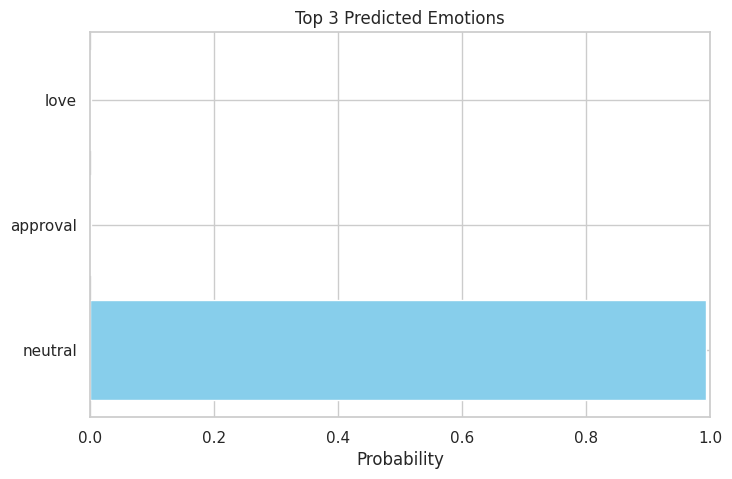

Enter a sentence to classify its emotion (or type 'exit' to quit): fuck you bro
Predicted class index: 2, Emotion: anger

Top 3 Predicted Emotions:
anger: 0.9314
annoyance: 0.0279
neutral: 0.0187


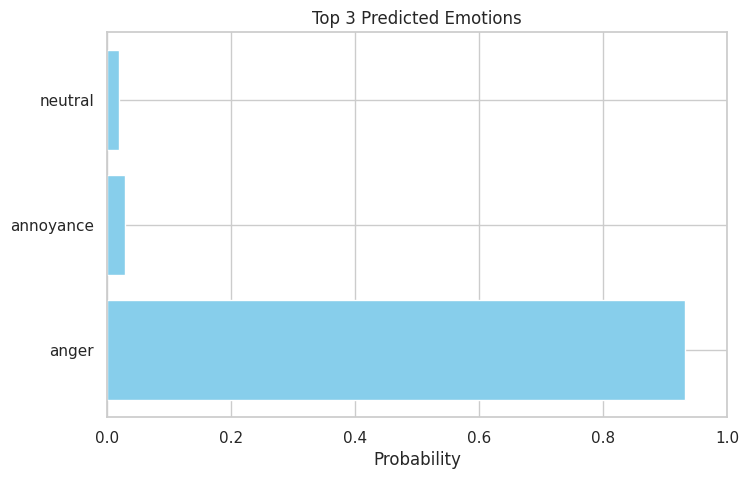

Enter a sentence to classify its emotion (or type 'exit' to quit): i want him to die
Predicted class index: 27, Emotion: neutral

Top 3 Predicted Emotions:
neutral: 0.4917
desire: 0.3770
sadness: 0.0400


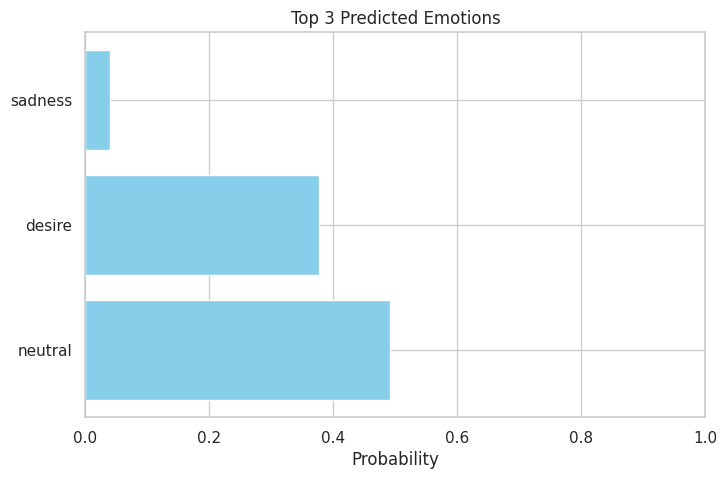

Enter a sentence to classify its emotion (or type 'exit' to quit): please i need it right now
Predicted class index: 27, Emotion: neutral

Top 3 Predicted Emotions:
neutral: 0.6408
desire: 0.2853
approval: 0.0244


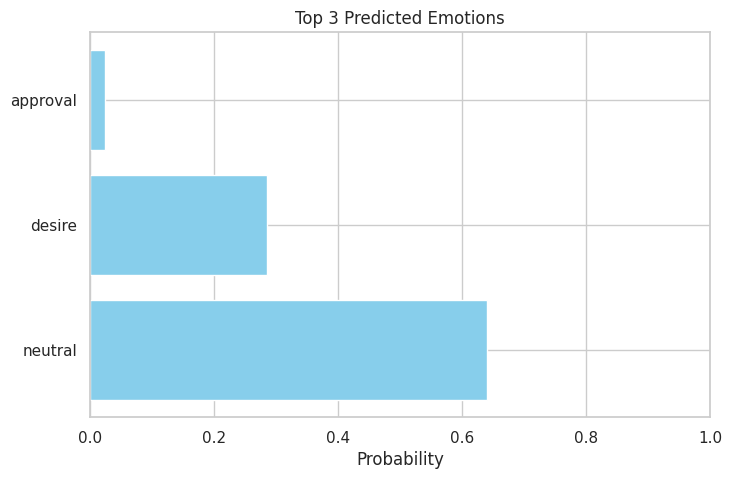

Enter a sentence to classify its emotion (or type 'exit' to quit): i want the biggest car in the world for me
Predicted class index: 8, Emotion: desire

Top 3 Predicted Emotions:
desire: 0.9417
neutral: 0.0242
optimism: 0.0058


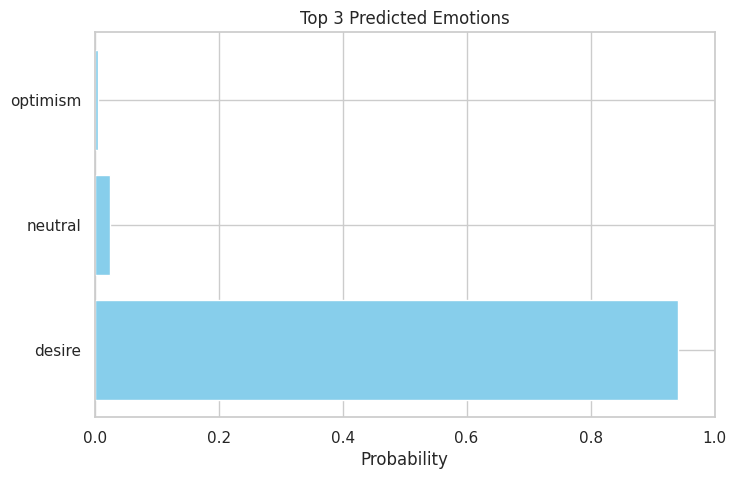

Enter a sentence to classify its emotion (or type 'exit' to quit): exit


In [ ]:
while True:
    user_input = input("Enter a sentence to classify its emotion (or type 'exit' to quit): ")

    if user_input.lower() == 'exit':
        break

    classify_emotion(user_input)

Speech to text

In [ ]:
!pip install SpeechRecognition pydub transformers torch seaborn matplotlib

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 32.8/32.8 MB 52.5 MB/s eta 0:00:00


In [ ]:
!pip install transformers torchaudio

In [ ]:
# 1. Upload the audio file
from google.colab import files

print("Please upload your audio file (preferably .wav format).")
uploaded = files.upload()  # This will prompt you to select a file for upload
file_name = list(uploaded.keys())[0]  # Automatically selects the uploaded file
waveform, sample_rate = torchaudio.load(file_name)  # Load audio data

Please upload your audio file (preferably .wav format).


Saving 03-01-01-01-01-02-05.wav to 03-01-01-01-01-02-05.wav


In [ ]:
target_sample_rate = 16000
if sample_rate != target_sample_rate:
    resampler = torchaudio.transforms.Resample(orig_freq=sample_rate, new_freq=target_sample_rate)
    waveform = resampler(waveform)
    sample_rate = target_sample_rate

In [ ]:
! pip install transformers librosa torch

In [ ]:
import torch
from transformers import Wav2Vec2Processor, Wav2Vec2ForCTC
import librosa
import numpy as np

# Load Wav2Vec2 processor and model
processor = Wav2Vec2Processor.from_pretrained("facebook/wav2vec2-base-960h")
model_wav2vec = Wav2Vec2ForCTC.from_pretrained("facebook/wav2vec2-base-960h")

# Function to load audio from a file
def load_audio_file(audio_file):
    # Use librosa to load the audio file
    audio_data, sample_rate = librosa.load(audio_file, sr=16000)  # Resample to 16000 Hz
    return audio_data

# Function to perform speech-to-text using Wav2Vec2
def speech_to_text_wav2vec(audio):
    # Preprocess the audio
    inputs = processor(audio, sampling_rate=16000, return_tensors="pt", padding=True)

    # Run the model without gradients (inference mode)
    with torch.no_grad():
        logits = model_wav2vec(inputs.input_values).logits

    # Get the predicted ids (most likely words/phonemes)
    predicted_ids = torch.argmax(logits, dim=-1)

    # Decode the predicted ids to get the transcription text
    transcription = processor.batch_decode(predicted_ids)[0]

    print("Transcription:", transcription)
    return transcription

# Path to your audio file
audio_file = '/content/03-01-01-01-01-02-05.wav'  # Replace with the path to your audio file

# Load the audio file
audio = load_audio_file(audio_file)

# Call the speech-to-text function
transcription = speech_to_text_wav2vec(audio)



Some weights of Wav2Vec2ForCTC were not initialized from the model checkpoint at facebook/wav2vec2-base-960h and are newly initialized: ['wav2vec2.masked_spec_embed']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Transcription: KIDS ARE TALKING BY THE DOOR


Predicted class index: 9, Emotion: disappointment

Top 3 Predicted Emotions:
disappointment: 0.8425
sadness: 0.0501
annoyance: 0.0214


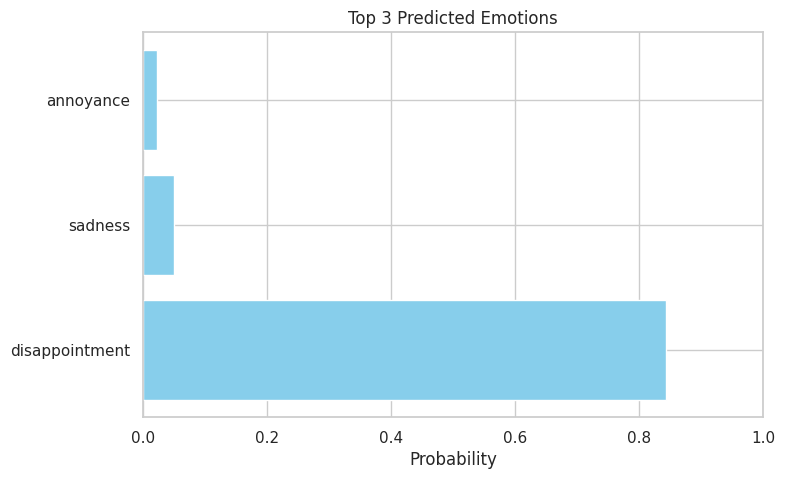

In [ ]:
classify_emotion("I thought this year would be different, but it feels like nothing is ever going my way. It’s hard to stay positive when I’m constantly disappointed by the people around me and the things I hope for never seem to come true. I just feel like I’m stuck in a dark place and can’t find a way out.")

In [ ]:
!pip install matplotlib ipywidgets scipy

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 14.2 MB/s eta 0:00:00


In [ ]:
sample_1 = '/content/I can-t believe how lucky 2.wav'
sample_2 = '/content/I desire more than just m 1.wav'
sample_3 = '/content/I-m absolutely furious ri 1.wav'
sample_4 = '/content/I-ve always admired artis 1.wav'
sample_5 = '/content/YAF_bone_neutral.wav'
sample_6 = '/content/playht20_EgDxrH7UggwOAyBaUrzWX.wav'

In [ ]:
Audio(sample_1)

In [ ]:
Audio(sample_2)

In [ ]:
Audio(sample_3)

In [ ]:
Audio(sample_4)

In [ ]:
Audio(sample_5)

In [ ]:
Audio(sample_6)

In [ ]:
sample1 = load_audio_file(sample_1)
sample2 = load_audio_file(sample_2)
sample3 = load_audio_file(sample_3)
sample4 = load_audio_file(sample_4)
sample5 = load_audio_file(sample_5)
sample6 = load_audio_file(sample_6)

Transcription: I CAN'T BELIEVE HOW LUCKY I AM NOT ONLY DID I GET THE JOB I'VE BEEN DREAMING OF BUT I ALSO GOT TO SHARE THE NEWS WITH MY FAMILY WHO COULDN'T HAVE BEEN MORE SUPPORTIVE THEIR HAPPINESS FOR ME MAKES THIS ACHIEVEMENT FEEL EVEN MORE SPECIAL AND I'M JUST SO GRATEFUL
Predicted class index: 0, Emotion: admiration

Top 3 Predicted Emotions:
admiration: 0.8946
joy: 0.0269
excitement: 0.0191


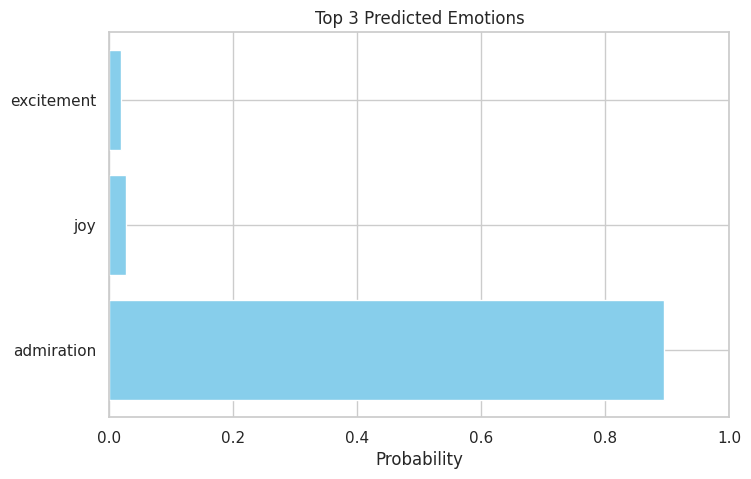

In [ ]:
samples1 = speech_to_text_wav2vec(sample1)
classify_emotion(samples1)

Transcription: I DESIRE MORE THAN JUST MATERIAL SUCCESS WHAT REALLY DRIVES ME IS THE IDEA OF MAKING A MEANINGFUL IMPACT ON THE WORLD WHETHER THAT'S TRUE HELPING OTHERS OR SOLVING PROBLEMS THAT AFFECT COMMUNITIES I WANT TO CREATE SOMETHING THAT MATTERS AND LEAVES A LASTING LEGACY
Predicted class index: 8, Emotion: desire

Top 3 Predicted Emotions:
desire: 0.6678
neutral: 0.1471
approval: 0.0501


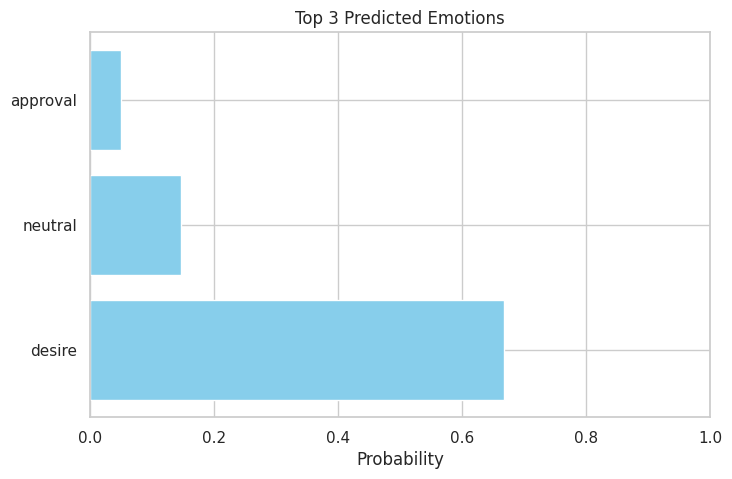

In [ ]:
samples2 = speech_to_text_wav2vec(sample2)
classify_emotion(samples2)

Transcription: I AM ABSOLUTELY FURIOUS RIY NOW I SPENT HOURS WORKING ON A PROJECT AND SOME ONE JUST COMPLETELY DISREGARDED MY EFFORT AND PRESENTED MY WORK AS THEIR OWN IS INCREDIBLY DISRESPECTFUL AND I'M STRUGGLING TO STAY CALM ABOUT IT
Predicted class index: 2, Emotion: anger

Top 3 Predicted Emotions:
anger: 0.4261
annoyance: 0.2178
admiration: 0.1146


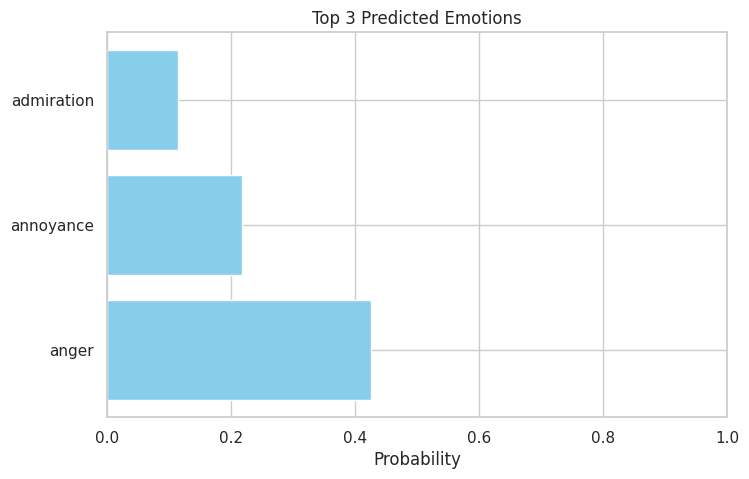

In [ ]:
samples3 = speech_to_text_wav2vec(sample3)
classify_emotion(samples3)

Transcription: I'VE ALWAYS ADMIRED ARTISTS WHO CAN CREATE SOMETHING BEAUTIFUL OUT OF NOTHING THE WAY THEY BRING THEIR VISIONS TO LIFE WHETHER THROUGH PAINTING MUSIC OR WRITING INSPIRES ME TO PURSUE MY OWN CREATIVE DREAMS THEY MAKE IT SEEM SO EFFORTLESS BUT I KNOW THE HARD WORK AND PASSION BEHIND EVERY MASTERPIECE
Predicted class index: 0, Emotion: admiration

Top 3 Predicted Emotions:
admiration: 0.9335
approval: 0.0296
neutral: 0.0214


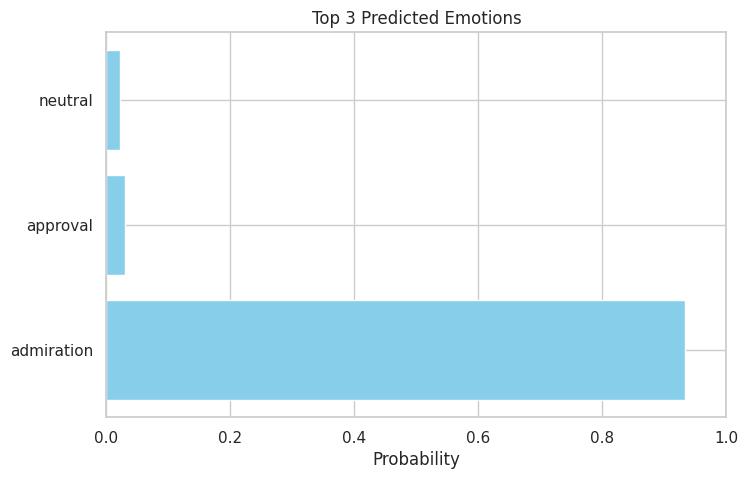

In [ ]:
samples4 = speech_to_text_wav2vec(sample4)
classify_emotion(samples4)

Transcription: I THOUGHT THIS YEAR WOULD BE DIFFERENT BUT IT FEELS LIKE NOTHING IS EVER GOING MY WAY IT'S HARD TO STAY POSITIVE WHEN I'M CONSTANTLY DISAPPOINTED BY THE PEOPLE AROUND ME AND THE THINGS I HOPE FOR NEVER SEEM TO COME TRUE I JUST FEEL LIKE I'M STUCK IN A DARK PLACE AND CAN'T FIND A WAY OUT
Predicted class index: 9, Emotion: disappointment

Top 3 Predicted Emotions:
disappointment: 0.6102
neutral: 0.1098
annoyance: 0.0633


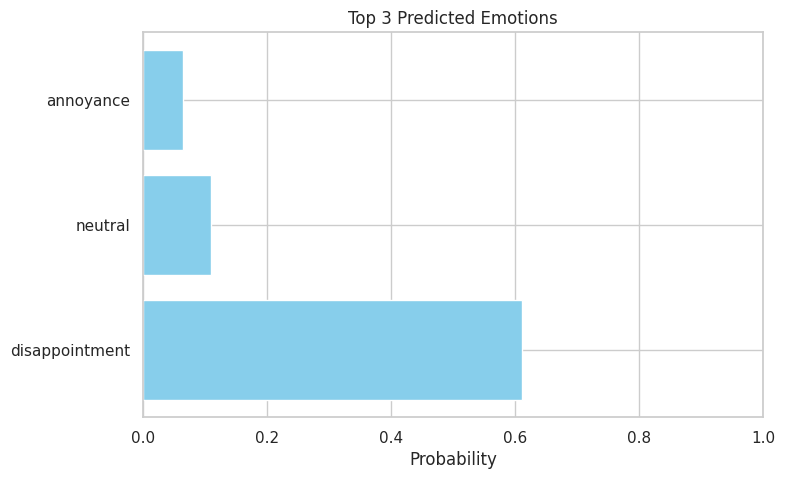

In [ ]:
samples5 = speech_to_text_wav2vec(sample5)
classify_emotion(samples5)

Transcription: THE SMELL OF SPOILED FOOD IS SOMETHING I CAN'T TOLERATE LAST WEEK I OPENED THE FRIDGE AND FOUND A CONTAINER THAT HAD BEEN FORGOTTEN THE STENCH WAS UNBEARABLE AND I HAD TO RUSH TO THE TRASH AN JUST TO GET AWAY FROM IT
Predicted class index: 27, Emotion: neutral

Top 3 Predicted Emotions:
neutral: 0.9575
anger: 0.0076
annoyance: 0.0073


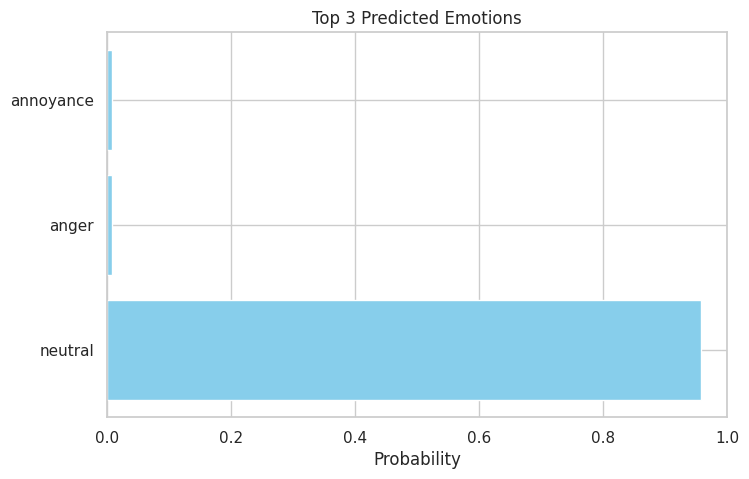

In [ ]:
samples6 = speech_to_text_wav2vec(sample6)
classify_emotion(samples6)